# Ouémé Boukou Forest Change

* **Products used:** 



## Background
Papers:





## Description
This is first draft and exploratory notebook 
Steps:

1. Load annual geomedian comoposite
2. Calculate various vegetation indices
3. Compare??

***

## Getting started
Load geojson file

### Load packages
Import Python packages that are used for the analysis.

Use standard import commands; some are shown below. 
Begin with any `iPython` magic commands, followed by standard Python packages, then any additional functionality you need from the `Scripts` directory.

In [7]:
%matplotlib inline

import datacube
import numpy as np
import pandas as pd
import xarray as xr
import geopandas as gpd
import matplotlib.pyplot as plt
from datacube.utils import geometry

from deafrica_tools.dask import create_local_dask_cluster
from deafrica_tools.datahandling import load_ard
from deafrica_tools.plotting import display_map, rgb, xr_animation, map_shapefile
from deafrica_tools.bandindices import calculate_indices
from deafrica_tools.spatial import xr_rasterize

### Connect to the datacube

Connect to the datacube so we can access DE Africa data.
The `app` parameter is a unique name for the analysis which is based on the notebook file name.

In [2]:
dc = datacube.Datacube(app='forest_fragmentation')

/env/lib/python3.6/site-packages/datacube/drivers/postgres/_connections.py:87: SADeprecationWarning: Calling URL() directly is deprecated and will be disabled in a future release.  The public constructor for URL is now the URL.create() method.
  username=username, password=password,


### Set up a dask cluster

This will help keep our memory use down and conduct the analysis in parallel. If you'd like to view the `dask dashboard`, click on the hyperlink that prints below the cell. You can use the dashboard to monitor the progress of calculations.


In [3]:
create_local_dask_cluster()

Client Scheduler: tcp://127.0.0.1:39131 Dashboard: /user/brianbterry/proxy/8787/status,Cluster Workers: 1 Cores: 7 Memory: 63.57 GB


### Analysis parameters

An *optional* section to inform the user of any parameters they'll need to configure to run the notebook:

* `param_name_1`: Simple description (e.g. `example_value`). Advice about appropriate values to choose for this parameter.
* `param_name_2`: Simple description (e.g. `example_value`). Advice about appropriate values to choose for this parameter.


In [57]:
index = 'EVI'

shapefile='data/oueme_boukou2.geojson'

time_range = ('2017-06', '2020-06')

resolution = (-20,20)

## Loading Data

> **Note:** Use this markdown format (sparingly) to draw particular attention to an important point or caveat

In [58]:
gdf = gpd.read_file(shapefile)
map_shapefile(gdf,attribute='Id')

Label(value='')

Map(center=[7.860216549953909, 2.458593050674966], controls=(ZoomControl(options=['position', 'zoom_in_text', …

In [59]:
geom = geometry.Geometry(geom=gdf.iloc[0].geometry, crs=gdf.crs)

In [63]:
# Create a reusable query
query = {
    'geopolygon': geom,
    'time': time_range,
    'product' : ["gm_s2_annual"],
    'measurements': ['green',
                     'red',
                     'blue',
                     'nir',
                     'red_edge_1',
                     'red_edge_2',
                     'red_edge_3',
                     'swir_1',
                    ],
    'resolution': resolution,
    'group_by': 'solar_day',
    'output_crs': 'EPSG:6933'
}

In [64]:
ds = dc.load(**query)

In [81]:
mask = xr_rasterize(gdf,ds)

In [82]:
ds_masked = ds.where(mask)

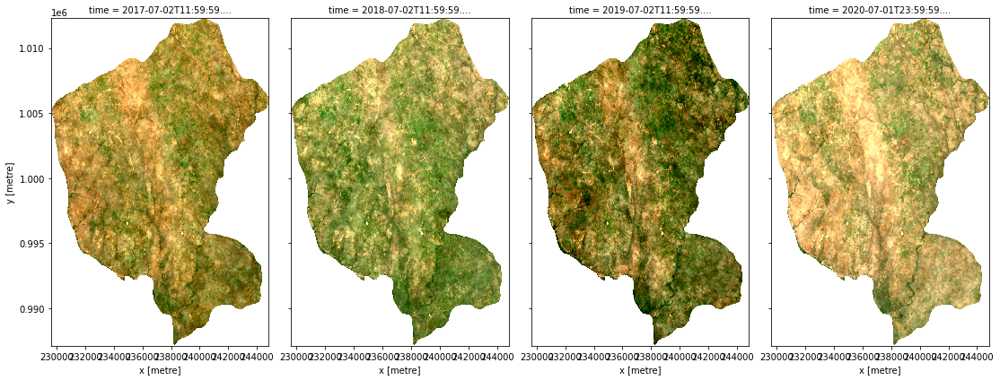

In [83]:
rgb(ds_masked,col='time')

Applying custom image processing functions


  0%|          | 0/4 (0.0 seconds remaining at ? frames/s)

Exporting animation to color_timeseries.gif


  0%|          | 0/4 (0.0 seconds remaining at ? frames/s)

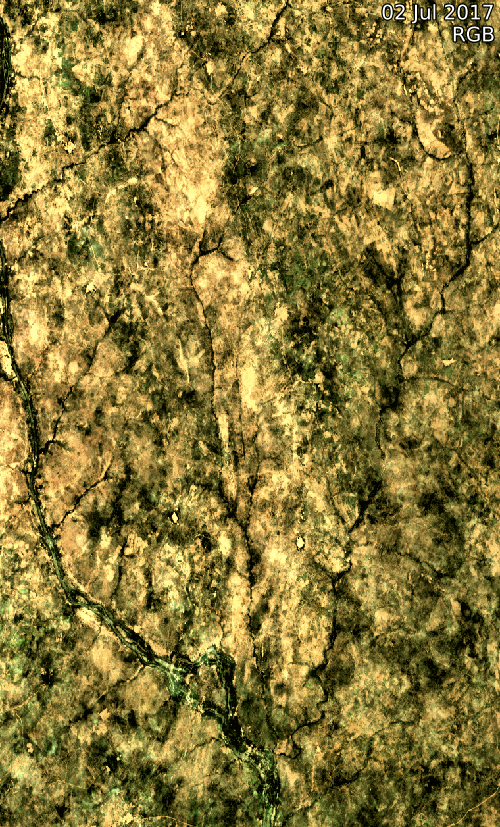

In [129]:
from IPython.display import Image
import skimage.exposure

xr_animation(ds=ds,
             bands=['red', 'green', 'blue'],
             output_path='color_timeseries.gif',
             show_text='RGB',
             interval= 300,image_proc_funcs=[skimage.exposure.rescale_intensity,                               
                               skimage.exposure.equalize_adapthist])
plt.close()
Image(filename='color_timeseries.gif')

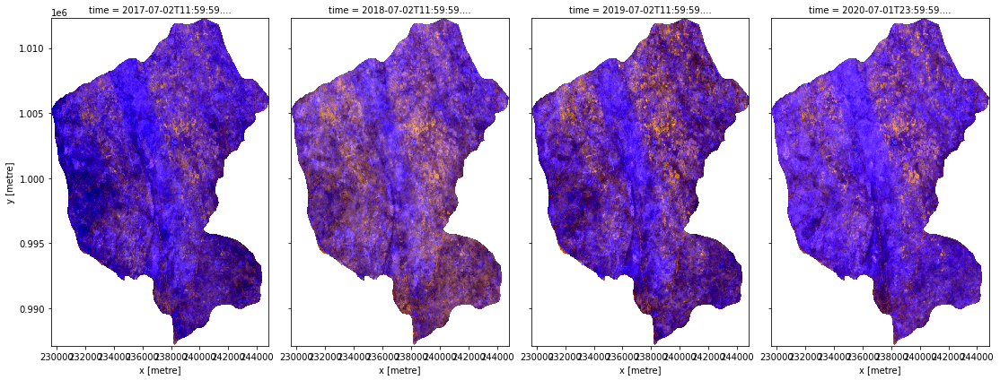

In [84]:
rgb(ds_masked,bands = ['nir', 'red_edge_2', 'swir_1'], col='time')

In [103]:
veg_ds = calculate_indices(ds, index = ['NDVI','EVI','MSAVI'], collection='s2', drop=True)

Dropping bands ['green', 'red', 'blue', 'nir', 'red_edge_1', 'red_edge_2', 'red_edge_3', 'swir_1']


In [122]:
# Normalised Difference Vegation Index, Rouse 1973
veg_ds['NDRE'] = (ds.nir - ds.red_edge_2) / (ds.nir + ds.red_edge_2)

In [123]:
veg_ds_masked = veg_ds.where(mask)

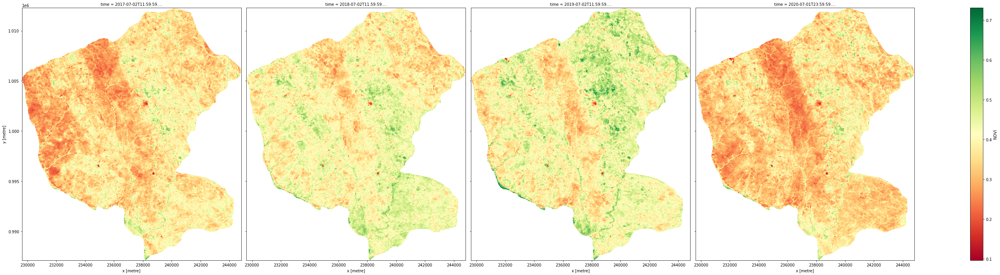

In [109]:
veg_ds_masked.NDVI.plot(col='time', size = 10, cmap='RdYlGn' )

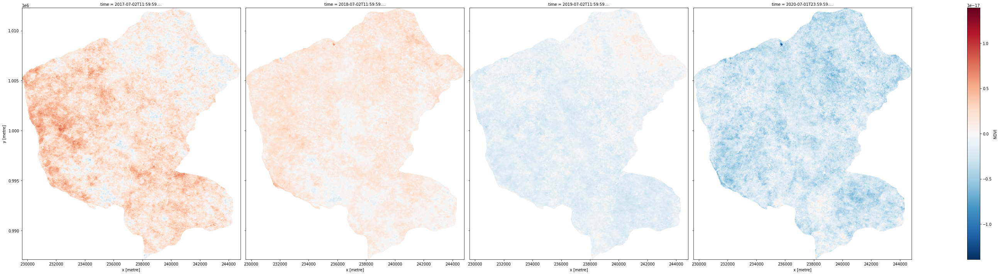

In [110]:
veg_ds_masked.differentiate('time').NDVI.plot(col='time', size = 10)

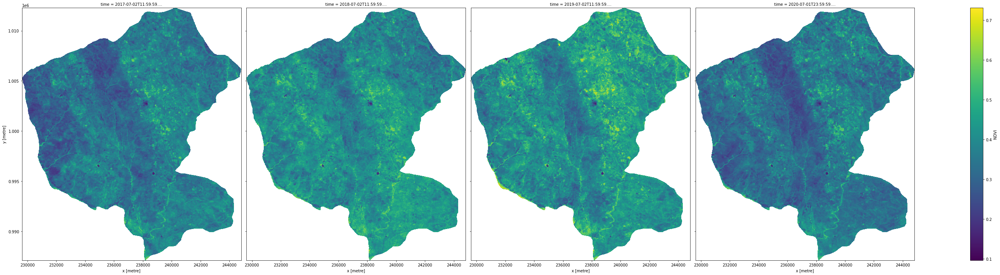

In [105]:
veg_ds_masked.EVI.plot(col='time', size = 10)

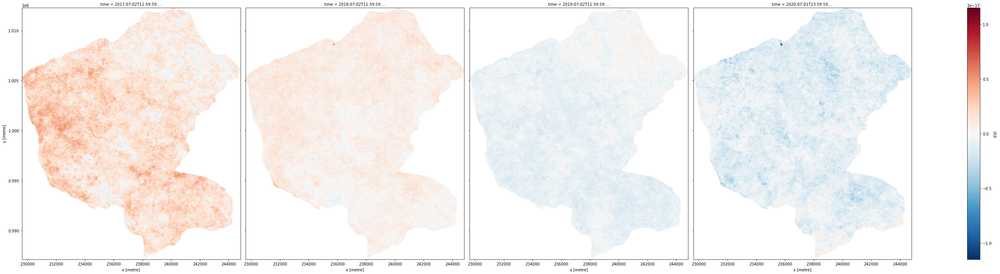

In [114]:
veg_ds_masked.differentiate('time').EVI.plot(col='time', size = 10)

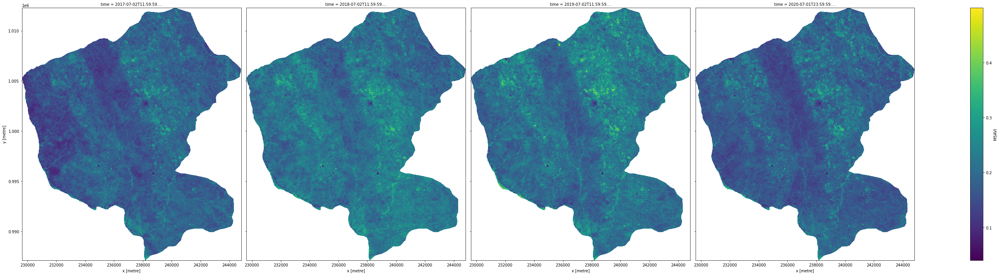

In [117]:
veg_ds_masked.MSAVI.plot(col='time', size = 10, cmap='viridis')

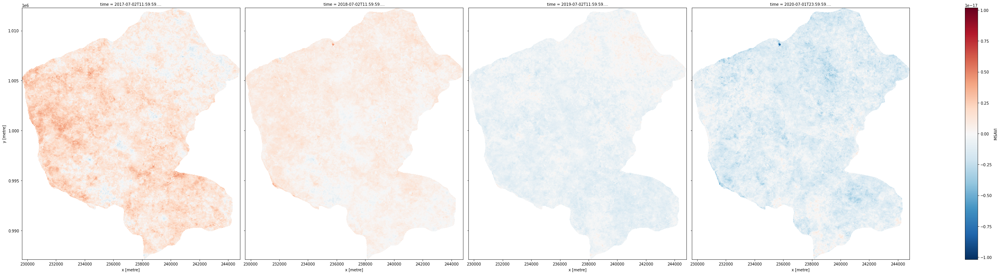

In [115]:
veg_ds_masked.differentiate('time').MSAVI.plot(col='time', size = 10)

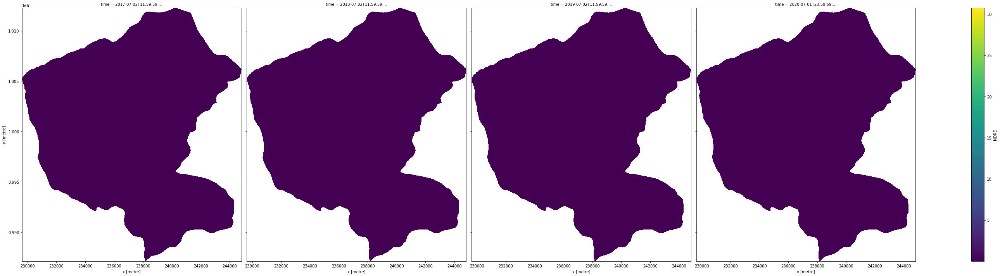

In [124]:
veg_ds_masked.NDRE.plot(col='time', size = 10)

### Subheading 1
Use subhedings to break up steps within a single section

## Heading 2


In [125]:
query = {
    'geopolygon': geom,
    'time': time_range,
    'product' : ["gm_s2_annual"],
    'measurements': ['SMAD',
                     'EMAD',
                     'BCMAD'
                    ],
    'resolution': resolution,
    'group_by': 'solar_day',
    'output_crs': 'EPSG:6933'
}

***

## Additional information

**License:** The code in this notebook is licensed under the [Apache License, Version 2.0](https://www.apache.org/licenses/LICENSE-2.0). 
Digital Earth Africa data is licensed under the [Creative Commons by Attribution 4.0](https://creativecommons.org/licenses/by/4.0/) license.

**Contact:** If you need assistance, please post a question on the [Open Data Cube Slack channel](http://slack.opendatacube.org/) or on the [GIS Stack Exchange](https://gis.stackexchange.com/questions/ask?tags=open-data-cube) using the `open-data-cube` tag (you can view previously asked questions [here](https://gis.stackexchange.com/questions/tagged/open-data-cube)).
If you would like to report an issue with this notebook, you can file one on [Github](https://github.com/digitalearthafrica/deafrica-sandbox-notebooks).

**Compatible datacube version:** 

In [7]:
print(datacube.__version__)

1.8.4.dev52+g07bc51a5


**Last Tested:**

In [8]:
from datetime import datetime
datetime.today().strftime('%Y-%m-%d')

'2021-03-02'